In [1]:
# Core scverse libraries
import scanpy as sc
import anndata as ad
import os
import glob
import numpy as np
import pandas as pd
import scipy.io
from collections import Counter
import warnings

# Data retrieval (pooch kept for any remote fetches if needed)
import pooch

In [3]:
import os
import scanpy as sc

h5_root = "/mnt/e/nhm/scRNA/h5"
sample_dirs = sorted([d for d in os.listdir(h5_root) if os.path.isdir(os.path.join(h5_root, d))])

adatas = []
for s in sample_dirs:
    candidate = os.path.join(h5_root, s, 'outs', 'filtered_feature_bc_matrix.h5')
    if not os.path.exists(candidate):
        candidate = os.path.join(h5_root, s, 'filtered_feature_bc_matrix.h5')
    if not os.path.exists(candidate):
        print(f"Skipping {s}: no file found")
        continue

    sample_adata = sc.read_10x_h5(candidate)

    # 尝试用 gene symbol 替换 var_names
    for col in ('gene_symbols', 'gene_names', 'gene_name', 'symbol'):
        if col in sample_adata.var.columns:
            sample_adata.var_names = sample_adata.var[col].astype(str)
            break

    # 去重 var_names（必须，防止 concat 报错）
    sample_adata.var_names_make_unique()

    # prefix barcodes 避免 obs 重复
    sample_adata.obs_names = [f"{s}-{bc}" for bc in sample_adata.obs_names]

    # 在 obs 中保存样本 id
    sample_adata.obs['sample'] = s

    adatas.append(sample_adata)

if len(adatas) == 0:
    raise RuntimeError("No samples read!")

/home/niuhm/.conda/envs/scRNA/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/niuhm/.conda/envs/scRNA/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/niuhm/.conda/envs/scRNA/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/niuhm/.conda/envs/scRNA/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/niuhm/.conda/envs/scRNA/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable n

合并

In [4]:
adata = sc.concat(adatas, join='outer', fill_value=0)

# 再次去重 var_names（保险）
adata.var_names_make_unique()

检查合并后的markergene

In [5]:
marker_genes = ['GAPDH', 'ACTB', 'CD4', 'CD8A', 'MKI67', 'PRDM1']
present_genes = [g for g in marker_genes if g in adata.var_names]
missing_genes = [g for g in marker_genes if g not in adata.var_names]

print("Present:", present_genes)
print("Missing:", missing_genes)

Present: ['GAPDH', 'ACTB', 'CD4', 'CD8A', 'MKI67', 'PRDM1']
Missing: []


In [6]:
# 定义 sample -> name 的映射字典
sample_name_map = {
    "Pla_HDBR10917733": "age_5week_Hrv100_1",
    "Pla_HDBR10701667": "age_6week_Hrv43_4",
    "Pla_HDBR10142769": "age_9week_Hrv46_1",
    "Pla_HDBR10917730": "age_9week_Hrv98_1",
    "Pla_HDBR10701668": "age_9week_Hrv46_3",
    "Pla_HDBR10917731": "age_8week_Hrv99_1",
    "Pla_HDBR10142770": "age_9week_Hrv46_2",
    "Pla_HDBR10701666": "age_6week_Hrv43_1",
    "Pla_HDBR10142767": "age_6week_Hrv43_2",
    "Pla_HDBR10142768": "age_6week_Hrv43_3",
    "Pla_HDBR8624431": "age_12week_H2_2",
    "Pla_HDBR8624430": "age_12week_H2_1",
    "Pla_HDBR8715514": "age_12_13week_H7a9_2",
    "Pla_HDBR8715512": "age_12_13week_H7a9_1",
}

# 在 adata.obs 中添加新列 'name'
adata.obs["name"] = adata.obs["sample"].map(sample_name_map)

# 检查结果
print(adata.obs[["sample", "name"]].drop_duplicates().sort_values("sample"))

                                               sample                  name
Pla_HDBR10142767-AAACCCAAGACCAGAC-1  Pla_HDBR10142767     age_6week_Hrv43_2
Pla_HDBR10142768-AAACCCAAGCGTTCAT-1  Pla_HDBR10142768     age_6week_Hrv43_3
Pla_HDBR10142769-AAACCCAAGACGTCGA-1  Pla_HDBR10142769     age_9week_Hrv46_1
Pla_HDBR10142770-AAACCCAAGTCAGGGT-1  Pla_HDBR10142770     age_9week_Hrv46_2
Pla_HDBR10701666-AAACCCAAGCCACTCG-1  Pla_HDBR10701666     age_6week_Hrv43_1
Pla_HDBR10701667-AAACCCAAGAGAGCCT-1  Pla_HDBR10701667     age_6week_Hrv43_4
Pla_HDBR10701668-AAACCCAAGAAAGCGA-1  Pla_HDBR10701668     age_9week_Hrv46_3
Pla_HDBR10917730-AAACCCAAGACGACGT-1  Pla_HDBR10917730     age_9week_Hrv98_1
Pla_HDBR10917731-AAACCCAAGAGAAGGT-1  Pla_HDBR10917731     age_8week_Hrv99_1
Pla_HDBR10917733-AAACCCAAGACATAAC-1  Pla_HDBR10917733    age_5week_Hrv100_1
Pla_HDBR8624430-AAACCTGAGTGTCCCG-1    Pla_HDBR8624430       age_12week_H2_1
Pla_HDBR8624431-AAACCTGAGTACACCT-1    Pla_HDBR8624431       age_12week_H2_2
Pla_HDBR8715

QC

In [7]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [8]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

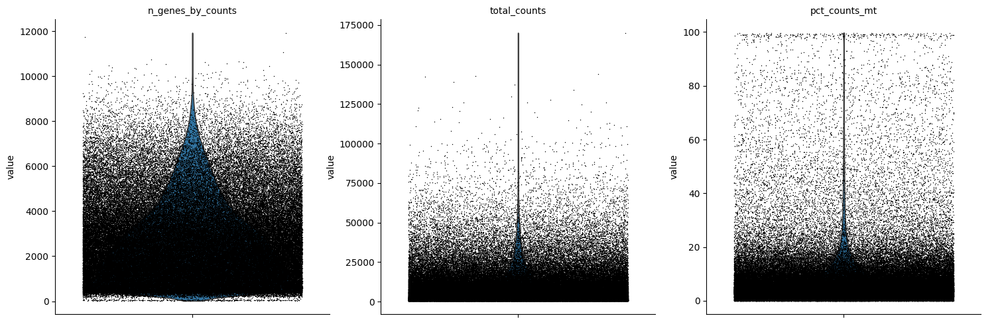

In [9]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

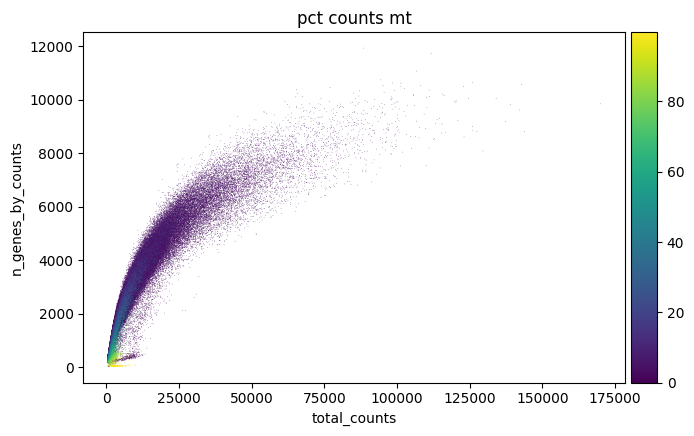

In [10]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [11]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

In [12]:
import scrublet as scr
import scanpy as sc
import numpy as np
import scipy.sparse as sp
import traceback
import sys
print(sys.executable)
import importlib.util
print(importlib.util.find_spec('scrublet'))

/home/niuhm/.conda/envs/scRNA/bin/python
ModuleSpec(name='scrublet', loader=<_frozen_importlib_external.SourceFileLoader object at 0x7fad037ca820>, origin='/home/niuhm/.conda/envs/scRNA/lib/python3.8/site-packages/scrublet/__init__.py', submodule_search_locations=['/home/niuhm/.conda/envs/scRNA/lib/python3.8/site-packages/scrublet'])


In [13]:
#adata是AnnData对象
counts_matrix = adata.X.copy()
#初始化scrublet对象
scrub = scr.Scrublet(counts_matrix)
#运行scrublet双细胞检测
doublet_scores, predicted_doublets = scrub.scrub_doublets()
#将结果添加到AnnaData中
adata.obs['doublet_score'] = doublet_scores
adata.obs['predicted_doublet'] = predicted_doublets
#过滤掉预测为双细胞的细胞
adata = adata[~adata.obs['predicted_doublet'], :].copy()
print('After doublet removal, AnnData shape:', adata.shape)

Preprocessing...


: 

In [14]:
#saving count data
adata.layers["counts"] = adata.X.copy()

In [15]:
#normalizing to median total counts 
sc.pp.normalize_total(adata)
#logarithmize the data
sc.pp.log1p(adata)

保留全部基因和高变基因

In [16]:
import scanpy as sc
sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat_v3", batch_key='sample')

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


##只保留高变基因，会导致后续的adata.var_gene在分析中缺失marker

In [41]:
import scanpy as sc
sc.pp.highly_variable_genes(adata, n_top_genes=2000, subset=True, flavor="seurat_v3", batch_key='sample')

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [17]:
genes_to_check = ["GAPDH", "ACTB", "CD4", "CD8A", "PRDM1", "MKI67"]
vn = adata.var_names.astype(str)

def find_matches(gene):
    # 精确匹配
    if gene in vn:
        return [gene]
    # 忽略大小写匹配
    matches = [x for x in vn if x.lower() == gene.lower()]
    if matches:
        return matches
    # 去掉末尾 .1/.2 等编号后匹配
    import re
    stripped = [re.sub(r'\.\d+$', '', x) for x in vn]
    matches = [vn[i] for i,x in enumerate(stripped) if x.lower() == gene.lower()]
    if matches:
        return matches
    # 部分匹配（包含）
    matches = [x for x in vn if gene.lower() in x.lower()]
    return matches

for g in genes_to_check:
    m = find_matches(g)
    print(g, "->", ("FOUND: " + str(m)) if m else "NOT FOUND")

GAPDH -> FOUND: ['GAPDH']
ACTB -> FOUND: ['ACTB']
CD4 -> FOUND: ['CD4']
CD8A -> FOUND: ['CD8A']
PRDM1 -> FOUND: ['PRDM1']
MKI67 -> FOUND: ['MKI67']


In [18]:
[gene for gene in adata.var_names if 'GAPDH' in gene]

['GAPDH', 'GAPDHS']

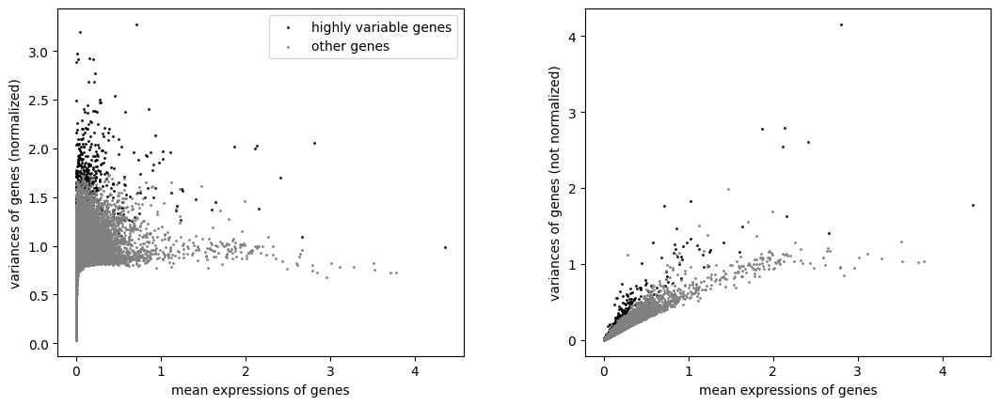

In [19]:
sc.pl.highly_variable_genes(adata)

In [20]:
sc.tl.pca(adata)

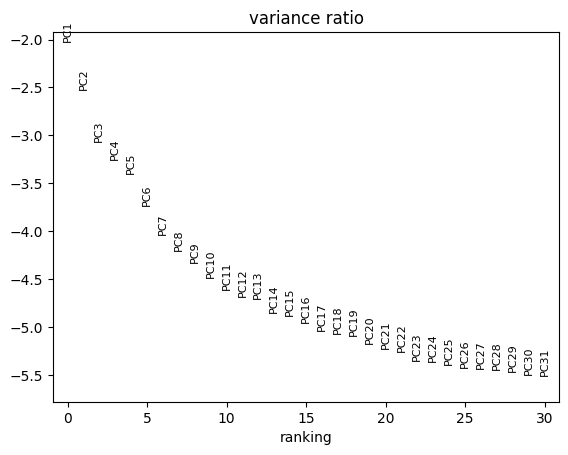

In [66]:
sc.pl.pca_variance_ratio(adata, log=True)

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


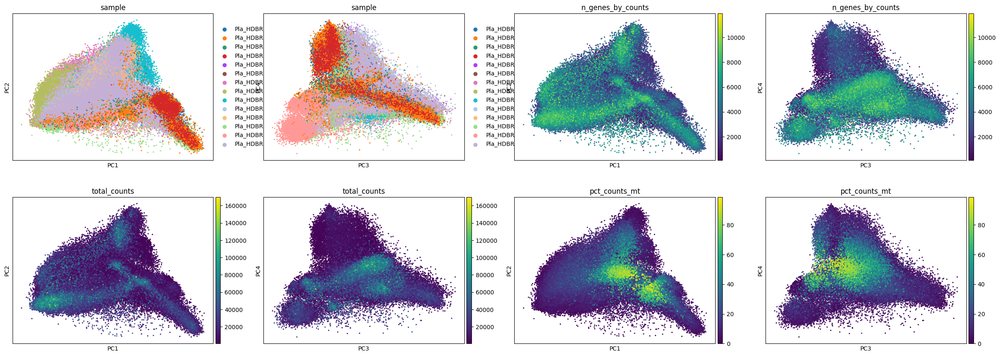

In [21]:
sc.pl.pca(
    adata, 
    color=["sample", "n_genes_by_counts", "total_counts", "pct_counts_mt"], 
    components=["1,2","3,4"],
    size=20,
)

In [22]:
sc.pp.neighbors(adata)

In [24]:
sc.tl.umap(adata)

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


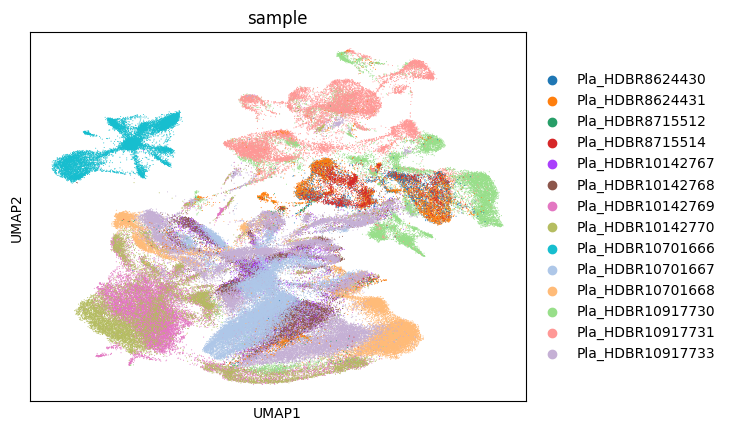

In [25]:
sc.pl.umap(
    adata,
    color="sample",
    size=2,
    
)

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


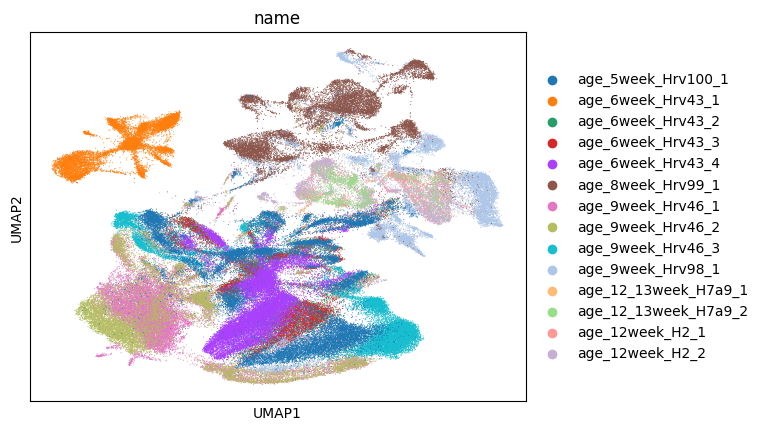

In [26]:
sc.pl.umap(
    adata,
    color="name",
    size=2,
    
)

In [27]:
#using the igraph implementation and a fixed number of iterations can be significantly faster,especially for large datasets
sc.tl.leiden(adata, n_iterations=2)

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


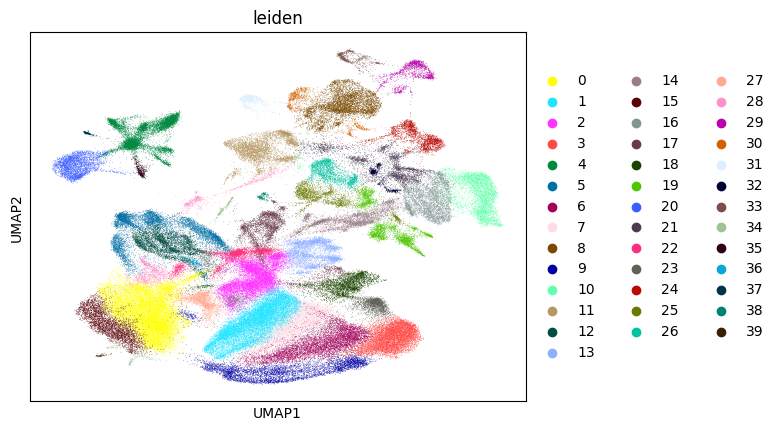

In [28]:
sc.pl.umap(adata,color=["leiden"],)

In [29]:
adata.obs.columns

Index(['sample', 'name', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score',
       'predicted_doublet', 'leiden'],
      dtype='object')

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


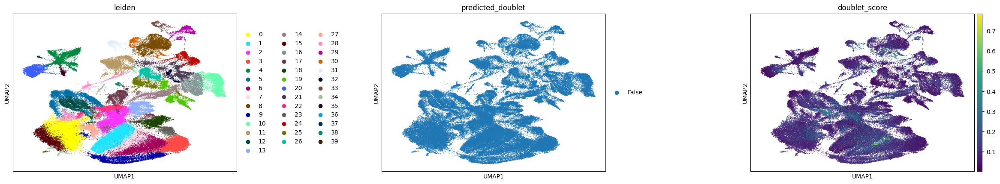

In [30]:
adata.obs["predicted_doublet"] = adata.obs["predicted_doublet"].astype("category")
adata.obs["doublet_score"] = adata.obs["doublet_score"].astype("float32")
sc.pl.umap(
    adata,
    color=["leiden","predicted_doublet","doublet_score"],
    wspace=0.5,
    size=3,
)

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


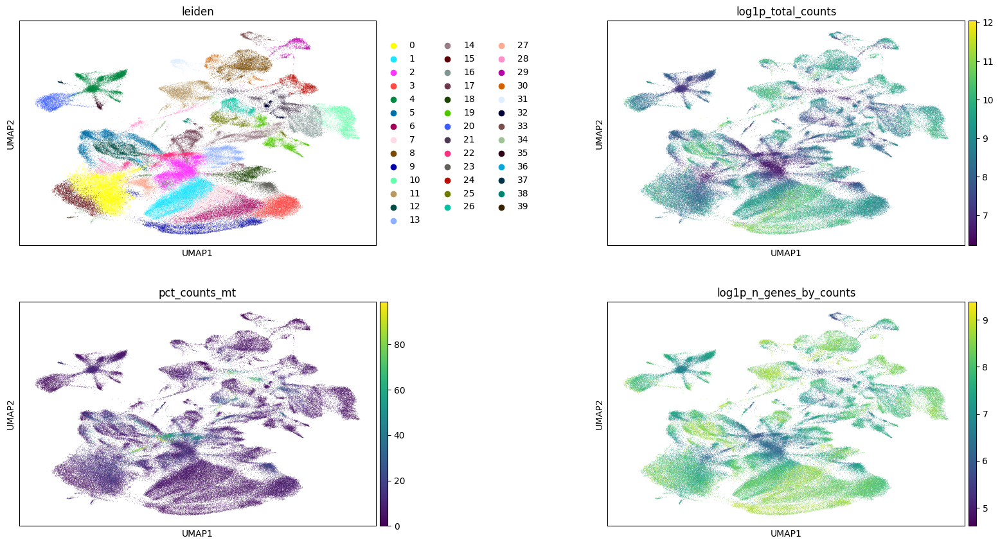

In [31]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
)

In [32]:
adata.write_h5ad("/mnt/storage/yxh/nhm/scRNA/placenta/combined_processed.h5ad")

手动细胞类型

细胞类型注释是一项费力且重复的任务，通常需要多轮子聚类和重新注释。

In [79]:
###这里请注意leiden_res_的书写方式，和下一步中的命名呼应好
for res in [0.02, 0.5, 2.0]:
    sc.tl.leiden(adata, 
                 key_added=f'leiden_res_{res:4.2f}', resolution=res
        )

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


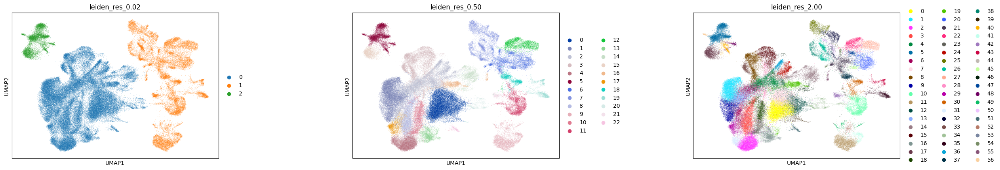

In [80]:
sc.pl.umap(
    adata,
    color=[f'leiden_res_0.02' ,"leiden_res_0.50", "leiden_res_2.00"],
    wspace=0.5,
)

marker gene set（根据其他文章中相同器官的大群marker来先定大群，然后再针对每个大群中所包含的小群marker定小群）

In [81]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    # Note: DMXL2 should be negative
    "cDC2": ["CST3", "COTL1", "LYZ", "DMXL2", "CLEC10A", "FCER1A"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    # Note HBM and GYPA are negative markers
    "Proerythroblast": ["CDK6", "SYNGR1", "HBM", "GYPA"],
    "NK": ["GNLY", "NKG7", "CD247", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    # Note IGHD and IGHM are negative markers
    "B cells": [
        "MS4A1",
        "ITGB1",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
    ],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    # Note PAX5 is a negative marker
    "Plasmablast": ["XBP1", "PRDM1", "PAX5"],
    "CD4+ T": ["CD4", "IL7R", "TRBC2"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
}

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


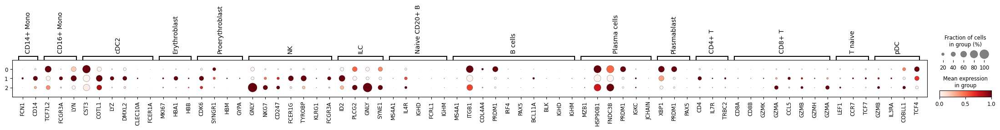

In [82]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.02", standard_scale="var")

根据标记表达模式，用它标记广泛谱系的粗略大群，记录在cell_type_lel1中

In [105]:
adata.obs["cell_type_lvl1"] = adata.obs["leiden_res_0.02"].map(
    {
        "0": "B Cells",
        "1": "Monocytes",
        "2": "Erythroid",
        
    }
)

切换到一个合适的分辨率leiden_res_0.5，手动使用点图以及聚类umap来注释这些细胞类型，进行子聚类

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


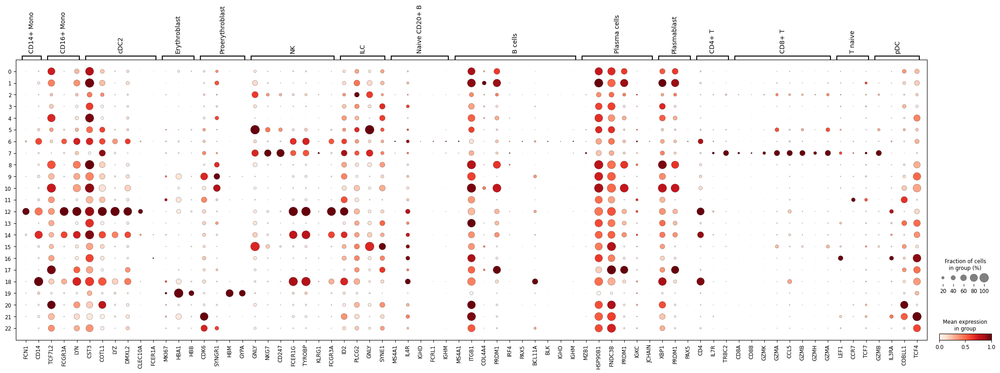

In [85]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.50", standard_scale="var")

差异表达基因作为标记

In [83]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.50", method="wilcoxon")

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:401: PerformanceWa

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


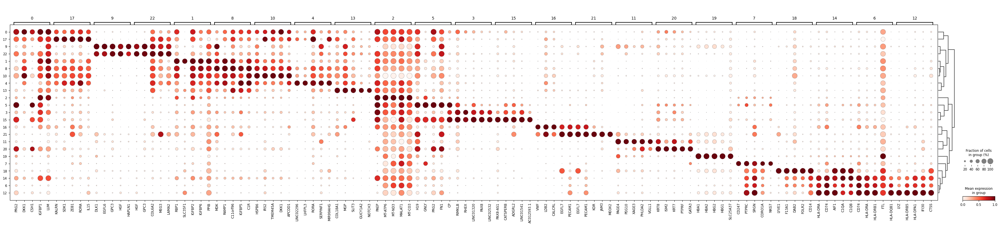

In [86]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res_0.50", standard_scale="var", n_genes=5
)

In [88]:
sc.get.rank_genes_groups_df(adata, group="7").head(5)

,names,scores,logfoldchanges,pvals,pvals_adj
0,CD247,111.580215,4.597435,0.0,0.0
1,PTPRC,107.711823,3.149664,0.0,0.0
2,SRGN,95.693184,2.546447,0.0,0.0
3,CORO1A,94.697769,3.804989,0.0,0.0
4,NKG7,93.676369,4.142460,0.0,0.0


/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


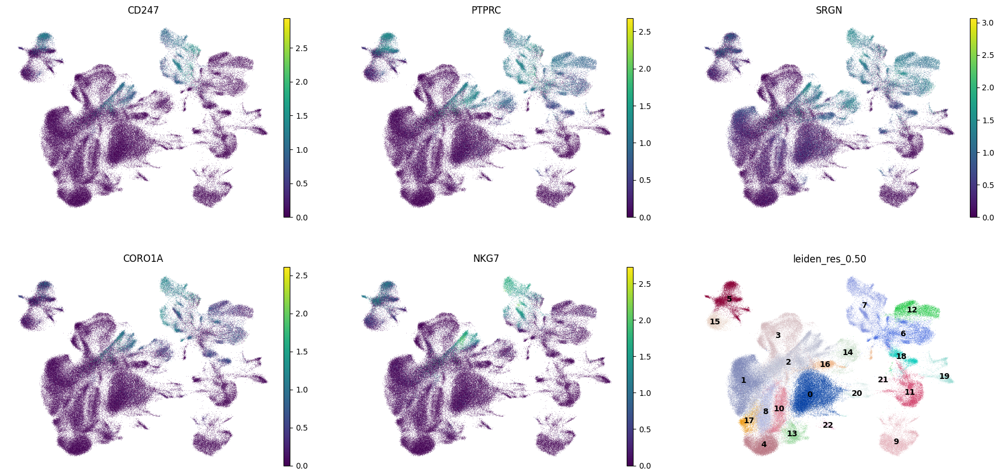

In [89]:
dc_cluster_genes = sc.get.rank_genes_groups_df(adata, group="7").head(5)["names"]
sc.pl.umap(
    adata,
    color=[*dc_cluster_genes, "leiden_res_0.50"],
    legend_loc="on data",
    frameon=False,
    ncols=3,
)

更强大的差异表达工具 pydeseq2

详细个性化显示

In [106]:
adata.obs.columns

Index(['sample', 'name', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score',
       'predicted_doublet', 'leiden', 'leiden_res:0.02', 'leiden_res:0.50',
       'leiden_res:2.00', 'leiden_res_0.02', 'leiden_res_0.50',
       'leiden_res_2.00', 'cell_type_lvl1', 'UMAP_1', 'UMAP_2'],
      dtype='object')

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/

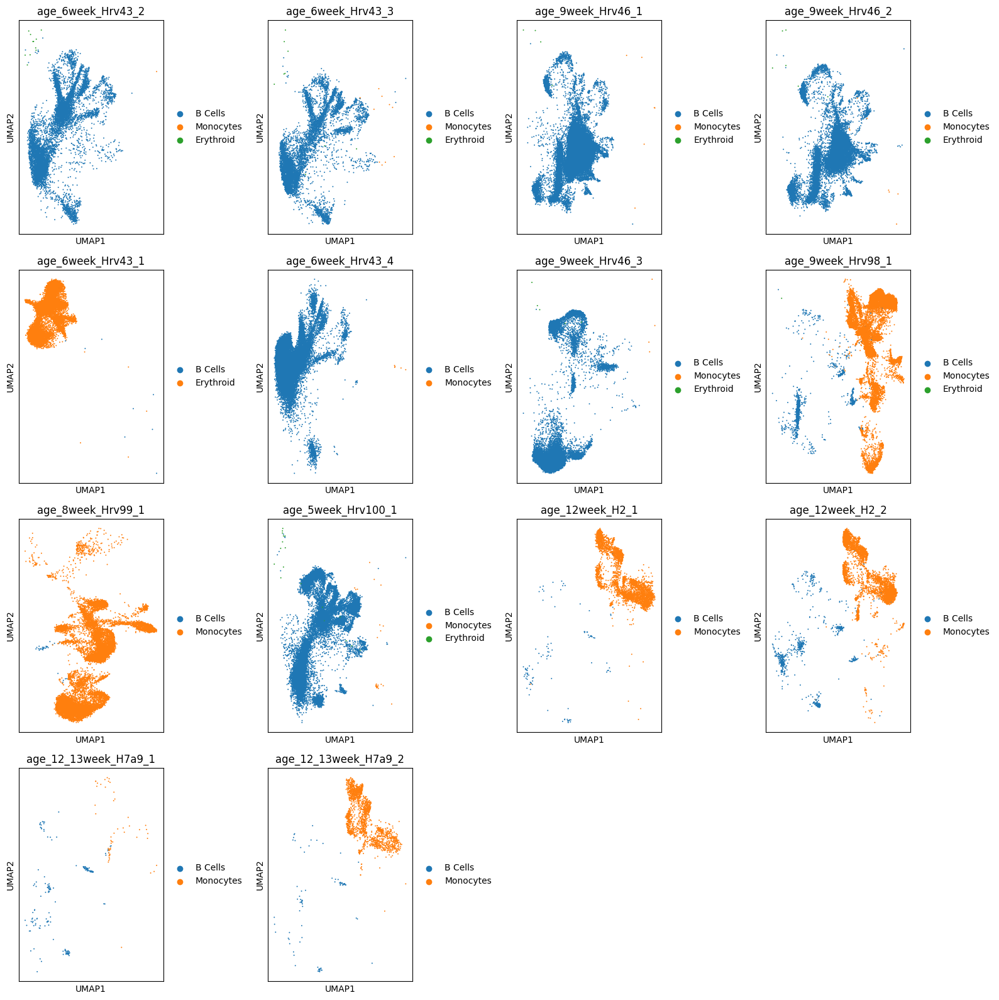

In [107]:
import scanpy as sc
import matplotlib.pyplot as plt

# 设定样本顺序（可选）
samples = adata.obs["name"].unique().tolist()

# 设定画布大小（根据样本数量自动调整）
n_samples = len(samples)
n_cols = 4  # 每行显示几个图，可根据需要调整
n_rows = (n_samples + n_cols - 1) // n_cols

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows)
)

axes = axes.flatten()

for i, n in enumerate(samples):
    ax = axes[i]
    sc.pl.umap(
        adata[adata.obs["name"] == n],
        color="cell_type_lvl1",
        title=n,
        size=8,
        ax=ax,
        show=False
    )

# 删除多余的空子图
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/storage/yxh/conda/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/

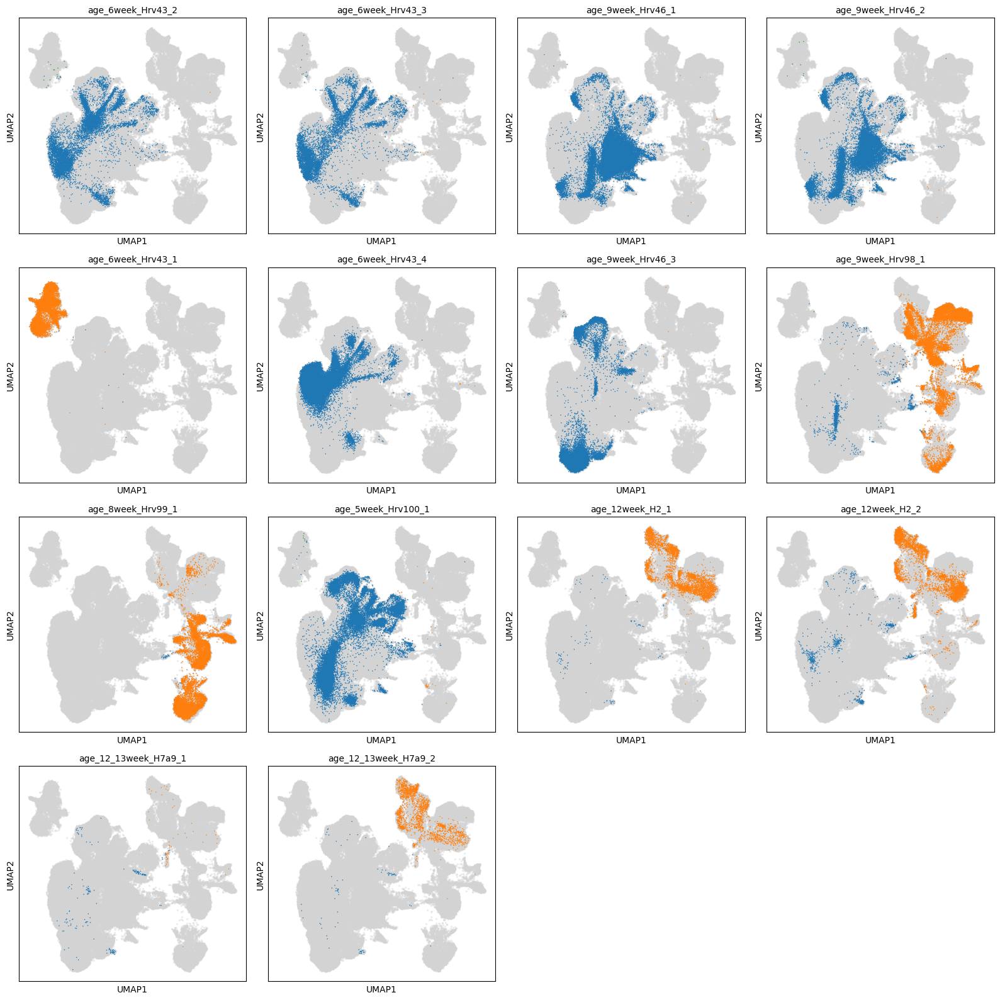

In [102]:
import scanpy as sc
import matplotlib.pyplot as plt

# 获取样本顺序
samples = adata.obs["name"].unique().tolist()

# UMAP 坐标
umap = adata.obsm["X_umap"]

# 添加 UMAP 坐标到 obs 中（方便绘图）
adata.obs["UMAP_1"] = umap[:, 0]
adata.obs["UMAP_2"] = umap[:, 1]

# 设置网格布局
n_cols = 4
n_rows = (len(samples) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

# 循环绘图
for i, n in enumerate(samples):
    ax = axes[i]
    data = adata.obs[adata.obs["name"] == n]
    # 背景点（灰色，表示其他样本的细胞）
    ax.scatter(
        adata.obs["UMAP_1"], adata.obs["UMAP_2"],
        s=2, c="lightgray", alpha=0.3
    )
    # 当前样本的细胞
    sc_data = adata[adata.obs["name"] == n]
    sc.pl.umap(
        sc_data,
        color="cell_type_lvl1",
        size=5,
        ax=ax,
        show=False,
        legend_loc=None,
    )
    ax.set_title(n, fontsize=10)

# 删除多余空子图
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

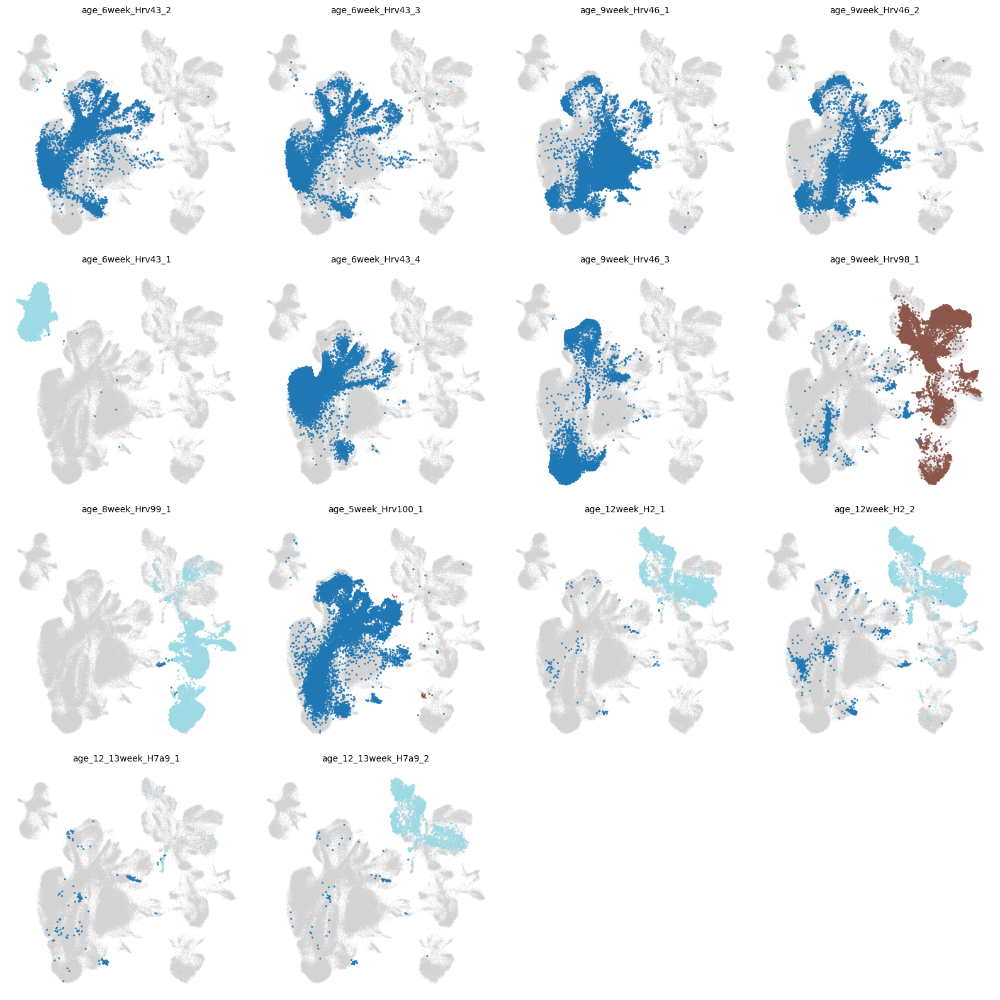

In [103]:
import scanpy as sc
import matplotlib.pyplot as plt

# 获取样本顺序
samples = adata.obs["name"].unique().tolist()

# UMAP 坐标添加到 obs（方便画）
adata.obs["UMAP_1"] = adata.obsm["X_umap"][:, 0]
adata.obs["UMAP_2"] = adata.obsm["X_umap"][:, 1]

# 布局设置
n_cols = 4
n_rows = (len(samples) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

# 每个样本绘图
for i, n in enumerate(samples):
    ax = axes[i]
    # 画背景：所有细胞灰色
    ax.scatter(
        adata.obs["UMAP_1"], adata.obs["UMAP_2"],
        s=1, c="lightgray", alpha=0.3, linewidths=0
    )
    # 当前样本细胞：彩色显示 cell_type_lvl1
    subset = adata.obs[adata.obs["name"] == n]
    ax.scatter(
        subset["UMAP_1"], subset["UMAP_2"],
        s=5,
        c=subset["cell_type_lvl1"].astype("category").cat.codes,
        cmap="tab20",
        alpha=0.9,
        linewidths=0,
    )
    ax.set_title(n, fontsize=10)
    ax.axis("off")

# 删除多余子图
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

一级分类（大群）

In [104]:
adata.obs['cell_type_lvl1'].value_counts()

cell_type_lvl1
Lymphocytes    108024
Monocytes       37834
Erythroid       11952
Name: count, dtype: int64